In [4]:
import os
import numpy as np
import pandas as pd

import torch
from torch.utils.data import Dataset
from torchvision import transforms
from torchvision.io import read_image

In [5]:
class CarDataset(Dataset):
    def __init__(self, img_path, img_size, grid_shape, normalization=False): #Normalize the image or not
        self.img_path = img_path
        self.img_size = img_size
        self.grid_shape = grid_shape
        
        self.file_names = os.listdir(img_path)
        self.labels = pd.read_csv("./data/train_labels.csv")
        
        self.normalize = transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
        self.normalization = normalization
        
    def __len__(self):
        return len(self.file_names)
    
    def __getitem__(self, idx):
        file_name = self.file_names[idx]
        
        #Images that don't have any cars in them are not listed in csv file.
        #Boolean : check if image s listed in csv file
        detection_found = (self.labels["image"] == file_name).any()  
        image, label = self.getData(file_name, idx, detection_found)
        
        image = transforms.Resize((self.img_size, self.img_size))(image)
        if self.normalization:
            image = self.normalize(image)
            
        return image, label
        
    def getData(self, file_name, idx, detection_found):
        image_path = os.path.join(self.img_path, file_name)
        image = read_image(image_path).float()

        grid_cell_output = torch.Tensor([0,0.5,0.5,0,0]) # prob, x, y, h, w for empty region
        output = torch.tile(grid_cell_output, (self.grid_shape,self.grid_shape,1))
        output = output.permute(2,0,1)
        
        if detection_found:
            grid_size = self.img_size / self.grid_shape
            
            original_img_height = image.shape[1]
            original_img_width = image.shape[2]
            
            original_grid_width = (original_img_width/self.grid_shape)
            original_grid_height = (original_img_height/self.grid_shape)
            
            boxes = self.labels.loc[self.labels["image"] == file_name]
            
            for box in boxes.iterrows():
                xmin = box[1][1]
                ymin = box[1][2]
                xmax = box[1][3]
                ymax = box[1][4]

                x = ((xmin + xmax)/2 ) / original_img_width

                
                y = ((ymin + ymax)/2 ) / original_img_height

                h = (ymax - ymin) / original_img_height
                w = (xmax - xmin) / original_img_width

                #Position of grid cell
                grid_cell_x = int(((xmin + xmax)/2) // (original_img_width/self.grid_shape))
                grid_cell_y = int(((ymin + ymax)/2) // (original_img_height/self.grid_shape))
                output[:, grid_cell_y, grid_cell_x] = torch.Tensor([1, x, y, h, w])
    
        return image, output

In [6]:
img_size = 448
grid_shape = 7

visualisation_data = CarDataset("./data/training_images", img_size=img_size, grid_shape=grid_shape, normalization=False)
trainset = CarDataset("./data/training_images", img_size=img_size, grid_shape=grid_shape, normalization=False)


In [7]:
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(trainset, shuffle=True, batch_size=batch_size, num_workers=2)

visual_loader = DataLoader(visualisation_data, shuffle=True, batch_size=batch_size, num_workers=2)

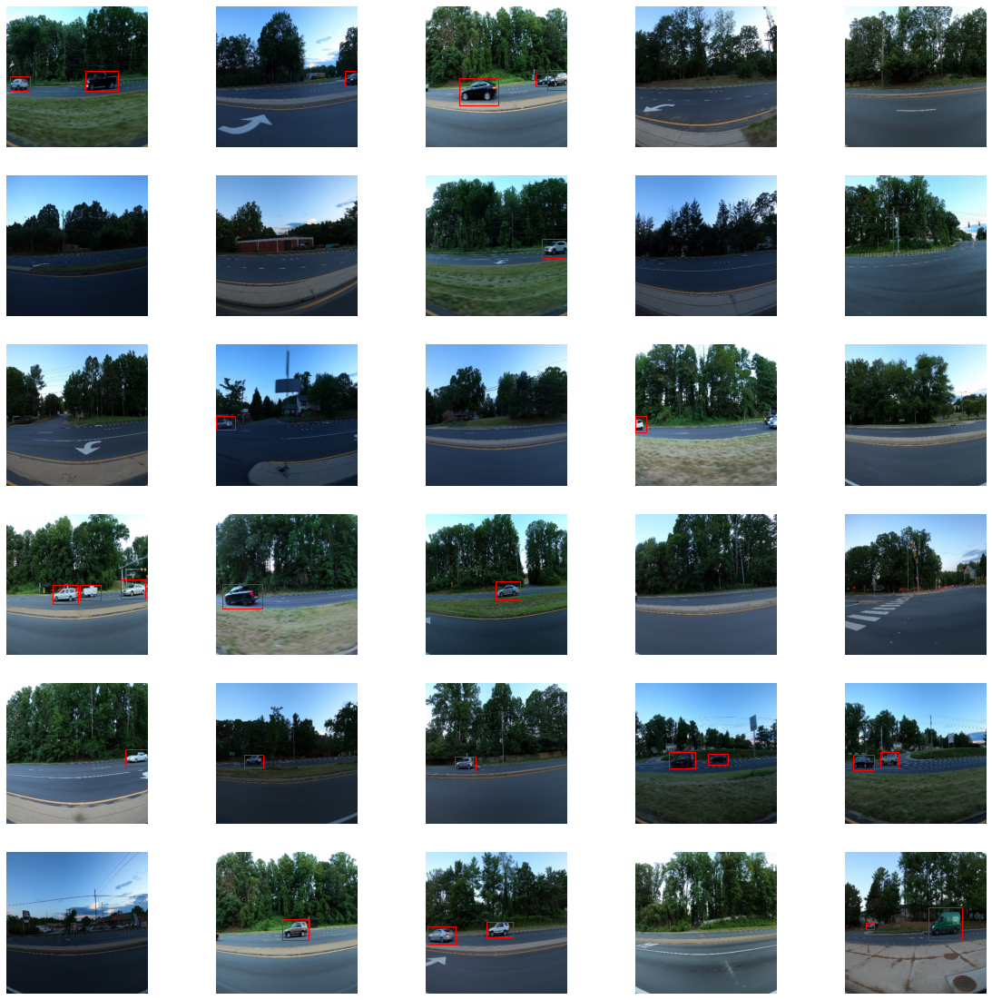

In [8]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

threshold = 0.5
dataiter = iter(visual_loader)

image, label = next(dataiter)

fig, ax = plt.subplots(nrows=6, ncols=5, figsize=(20,20) )
i=1
for row in ax:
    for col in row:
        col.axis("off")
        col.imshow(image[i].permute(1, 2, 0).numpy().astype('uint8'))
        index0, index1 = (label[i,0,:,:] > threshold).nonzero(as_tuple=True)
        for i0,i1 in zip(index0, index1):
            w = label[i, 4, i0, i1] * img_size
            h = label[i, 3, i0, i1] * img_size
            x = label[i, 1, i0, i1] * img_size  - (w/2)
            y = label[i, 2, i0, i1] * img_size - (h/2)
            
            rect = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
            col.add_patch(rect)
        i+=1
    
plt.show()

In [9]:
from torch import nn

device = 'cuda' if torch.cuda.is_available() else 'cpu'

class YOLO(nn.Module):
    def __init__(self):
        super(YOLO, self).__init__()
        torch.manual_seed(0)
        self.maxPool = nn.MaxPool2d(kernel_size=2)
        self.relu = nn.ReLU()
        
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=7, padding=3, stride=2)
        self.batchNorm1 = torch.nn.BatchNorm2d(64)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=5, padding=2)
        self.batchNorm2 = torch.nn.BatchNorm2d(128)
        self.conv3 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1)
        self.batchNorm3 = torch.nn.BatchNorm2d(256)
        self.conv4 = nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1)
        self.batchNorm4 = torch.nn.BatchNorm2d(512)
        self.conv5 = nn.Conv2d(in_channels=512, out_channels=1024, kernel_size=1)
        self.batchNorm5 = torch.nn.BatchNorm2d(1024)
        self.conv6 = nn.Conv2d(in_channels=1024, out_channels=1024, kernel_size=1)
        self.batchNorm6 = torch.nn.BatchNorm2d(1024)
        self.conv7 = nn.Conv2d(in_channels=1024, out_channels=5, kernel_size=1)
        
        self.sequence = nn.Sequential(
            self.conv1,
            self.batchNorm1,
            self.relu,
            self.maxPool,
            self.conv2,
            self.batchNorm2,
            self.relu,
            self.maxPool,
            self.conv3,
            self.batchNorm3,
            self.relu,
            self.maxPool,
            self.conv4,
            self.batchNorm4,
            self.relu,
            self.maxPool,
            self.conv5,
            self.batchNorm5,
            self.relu,
            self.maxPool,
            self.conv6,
            self.batchNorm6,
            self.relu,
            self.conv7,
        )
        
    def forward(self, X):
        output = self.sequence(X)

        x1 = torch.sigmoid(output[:, 0:1, :, :])
        x2 = torch.abs(output[:, 1:, :, :])
        
        output = torch.cat((x1,x2), dim=1)
        return output

In [10]:
model = YOLO()
model = model.to(device)

In [11]:
from torch.utils.tensorboard import SummaryWriter

writer = SummaryWriter("logs")
writer.add_graph(model, image.to(device))

In [12]:
import torch.optim as optim

optimizer = optim.Adam(model.parameters(), lr=0.0001)

In [13]:
def loss_func(pred, target):
    loss = 0
    mse = torch.nn.MSELoss()
    indexCellsWithObj = torch.repeat_interleave(target[:, 0:1, :, :] == 1, 5, 1)
    indexCellsWithoutObj = torch.repeat_interleave(target[:, 0:1, :, :] != 1, 5, 1)
    
    loss += mse(target[indexCellsWithObj].reshape(5, -1)[1:3,:], pred[indexCellsWithObj].reshape(5, -1)[1:3,:])
    
    loss += mse(torch.sqrt(target[indexCellsWithObj].reshape(5, -1)[3:,:]), torch.sqrt(pred[indexCellsWithObj].reshape(5, -1)[3:,:]))
     
    loss += 5 * mse(pred[indexCellsWithObj].reshape(5, -1)[0,:], target[indexCellsWithObj].reshape(5, -1)[0,:])
    loss += 5 * mse(pred[indexCellsWithoutObj].reshape(5, -1)[0,:], target[indexCellsWithoutObj].reshape(5, -1)[0,:])
    
    return loss

In [14]:
def train_loop(dataloader, epoch):
    train_loss = 0
    train_total = 0
    for batch, (X, y) in enumerate(dataloader):
        X, y = X.to(device), y.to(device)
        pred = model(X)
        train_total += len(pred)

        loss = loss_func(pred, y)
        train_loss += loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
    print(f"Epoch: {epoch+1}, Train Loss: {train_loss/train_total}")
    
    writer.add_scalars("Training", {
            "Training": train_loss/train_total
        }, epoch)



In [15]:
#If running on Colab
%load_ext tensorboard
%tensorboard --logdir logs

"""
Else, run on terminal
tensorboard --logdir logs
"""

<IPython.core.display.Javascript object>

In [16]:
# Best model found after epoch 190

epochs = 190
for epoch in range(epochs):
    train_loop(train_loader, epoch)
    torch.save(model, f"./{epoch}.pt")

Epoch: 1, Train Loss: 0.033561475574970245
Epoch: 2, Train Loss: 0.023524653166532516
Epoch: 3, Train Loss: 0.019505435600876808
Epoch: 4, Train Loss: 0.017820965498685837
Epoch: 5, Train Loss: 0.012740056030452251
Epoch: 6, Train Loss: 0.011461162008345127
Epoch: 7, Train Loss: 0.009246080182492733
Epoch: 8, Train Loss: 0.008308683522045612
Epoch: 9, Train Loss: 0.007578222546726465
Epoch: 10, Train Loss: 0.005632391665130854
Epoch: 11, Train Loss: 0.005174764897674322
Epoch: 12, Train Loss: 0.004922675434499979
Epoch: 13, Train Loss: 0.004927174188196659
Epoch: 14, Train Loss: 0.005089488346129656
Epoch: 15, Train Loss: 0.005038463976234198
Epoch: 16, Train Loss: 0.005373260471969843
Epoch: 17, Train Loss: 0.004770325962454081
Epoch: 18, Train Loss: 0.0041991835460066795
Epoch: 19, Train Loss: 0.004374675918370485
Epoch: 20, Train Loss: 0.01054463628679514
Epoch: 21, Train Loss: 0.007228979375213385
Epoch: 22, Train Loss: 0.005526486784219742
Epoch: 23, Train Loss: 0.0055080223828554

In [17]:
def iou(box1, box2): #Each box has p, xmin, xmax, ymin, ymax 
    xmin = max(box1[1], box2[1])
    xmax = min(box1[2], box2[2])    
    ymin = max(box1[3], box2[3])    
    ymax = max(box1[4], box2[4])
    if xmin < xmax and ymin < ymax:
        area_intersection = (xmax - xmin) * (ymax - ymin)
        area_box1 = (box1[2] - box1[1]) * (box1[4] - box1[3])
        area_box2 = (box2[2] - box2[1]) * (box2[4] - box2[3])
        area_union = area_box1 + area_box2 - area_intersection
        return area_intersection / area_union
    return 0

In [18]:
def non_max_suppression(pred_label, confidence_threshold, iou_threshold):
    output = [] #Store boxes for each image
    for i in range(len(pred_label)):
        index0, index1 = (pred_label[i,0,:,:]>confidence_threshold).nonzero(as_tuple=True)
        boxes = torch.Tensor([])
        for i0,i1 in zip(index0, index1):
            p = pred_label[i, 0, i0, i1] #Confidence
            w = pred_label[i, 4, i0, i1] * img_size
            h = pred_label[i, 3, i0, i1] * img_size
            xmin = pred_label[i, 1, i0, i1] * img_size  - (w/2)
            ymin = pred_label[i, 2, i0, i1] * img_size - (h/2)
            xmax = xmin + w
            ymax = ymin + h
            boxes = torch.cat((boxes, torch.Tensor([[p, xmin, xmax, ymin, ymax]])), dim=0)

        filtered_boxes = torch.Tensor([])
        while len(boxes) != 0:
            highest_conf_box_index = torch.argmax(boxes[:, 0:1])
            highest_confidence_box = boxes[highest_conf_box_index, :]
            filtered_boxes = torch.cat((filtered_boxes, highest_confidence_box.reshape(1,5)))
            boxes = torch.cat((boxes[:highest_conf_box_index, :], boxes[highest_conf_box_index+1:, :]))
            
            box_i = 0#box_i = box index
            for box in boxes: 
                if iou(highest_confidence_box, boxes[box_i,:]) > iou_threshold:
                    boxes = torch.cat((boxes[:box_i, :], boxes[box_i+1:, :]))
                else:
                    i+=1
        
        output.append(filtered_boxes) 
        
    return output

In [19]:
class TestDataset(Dataset):
    def __init__(self, img_path, img_size, normalize=False):
        self.img_path = img_path
        self.img_size = img_size
        self.file_names = os.listdir(img_path)
        self.normalize = normalize
        
    def __len__(self):
        return len(self.file_names)
    
    def __getitem__(self, idx):
        file_name = self.file_names[idx]
        
        image_path = os.path.join(self.img_path, file_name)
        image = read_image(image_path).float()
        image = transforms.Resize((self.img_size, self.img_size))(image)
        if self.normalize:
            image = transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))(image)
        return image


In [20]:
batch_size = 40

testset = TestDataset("./data/testing_images", img_size)
test_loader = DataLoader(testset, shuffle=True, batch_size=batch_size, num_workers=2)

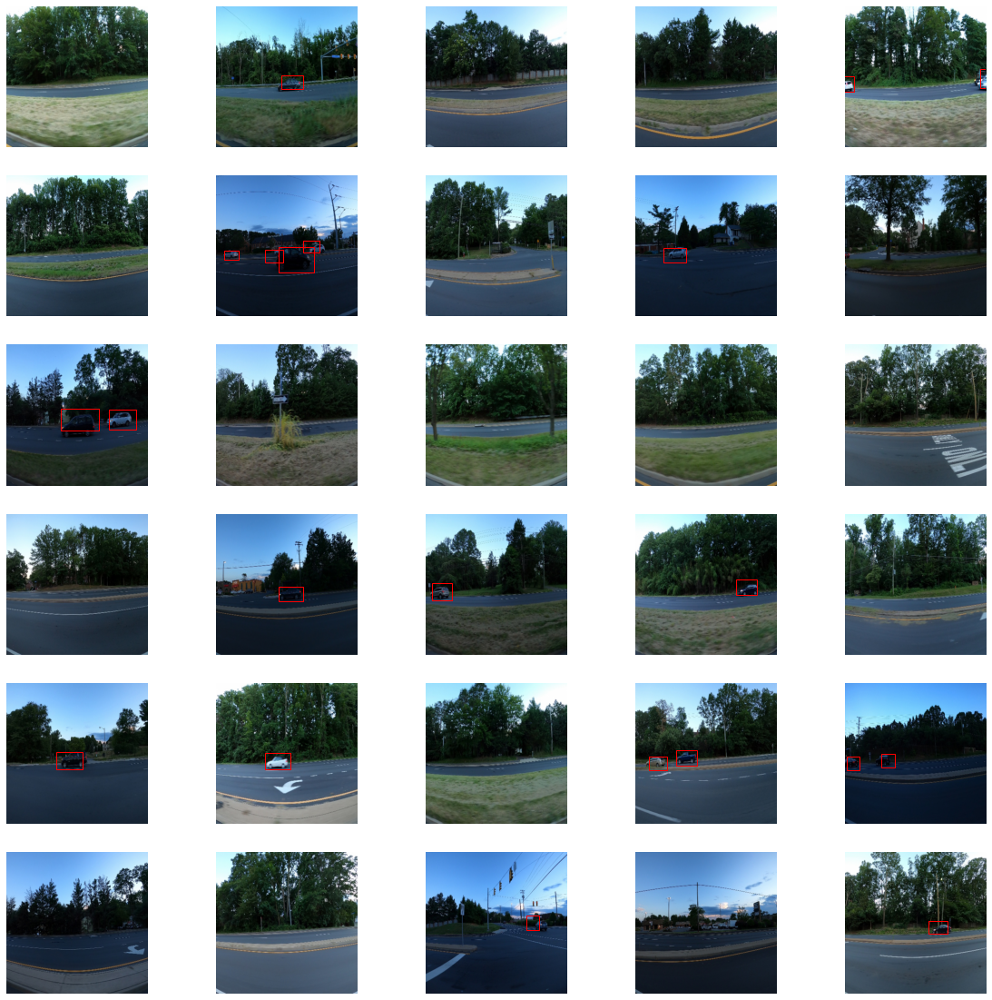

In [21]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

threshold = 0.5
dataiter = iter(visual_loader)
with torch.no_grad():    
    image,pred_ = next(dataiter)
    model = model.cpu()
    model.eval()
    pred_label = model(image)
    filtered_labels = non_max_suppression(pred_label, 0.5, 0.5)  #Contains p, xmin, xmax, ymin, ymax 
    fig, ax = plt.subplots(nrows=6, ncols=5, figsize=(20,20) )
    i=1
    for row in ax:
        for col in row:
            col.axis("off")
            col.imshow(image[i].permute(1, 2, 0).numpy().astype('uint8'))
            if len(filtered_labels[i]) != 0:
                for box in filtered_labels[i]:
                    w = box[2] - box[1]
                    h = box[4] - box[3]
                    x = box[1]
                    y = box[3]

                    rect = patches.Rectangle((x, y), w, h, linewidth=1.5, edgecolor='r', facecolor='none')
                    col.add_patch(rect)
            i+=1

plt.show()
